# Loading and pre-processing

In this first widget, data can be loaded, visualized and pre-processed, and regions of interest can be selected and masked if necessary. Batch pre-processing can also be started directly from this wifget.

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from pathlib import Path
import napari
from napari.utils import nbscreenshot
from napari_sediment.sediment_widget import SedimentWidget

In [3]:
viewer = napari.Viewer()
self = SedimentWidget(viewer)
viewer.window.add_dock_widget(self);

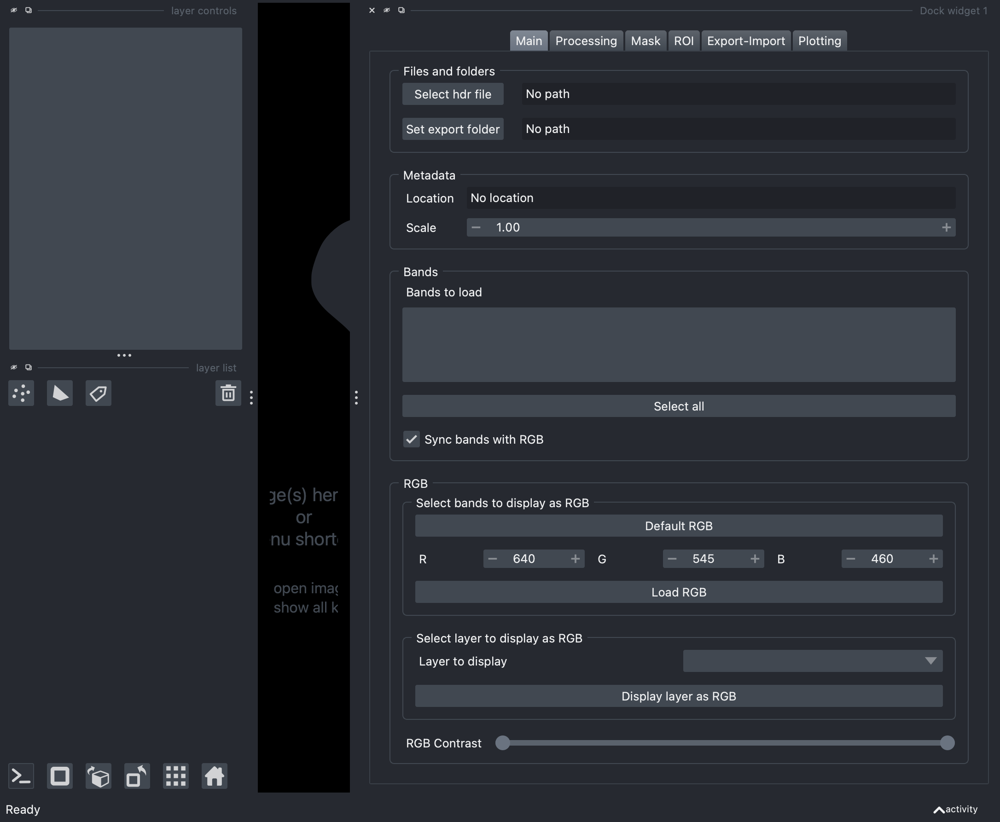

In [4]:
nbscreenshot(viewer)

Above you can see the interface of the pre-processing plugin which is split into multiple parts that we explore here.

## Main

### Files and folders

Here you can select the dataset to analyze by choosing the corresponding *hdr file* (and not the raw file). When a file is selected, the corresponding White and Dark correction images are searched for automatically. For this to work the corresponding the following folder structure is expected:
```
Main_123
├──Experiment1_123
│   └── capture
│       ├── myfile_123.hdr
│       ├── myfile_123.raw
│       ├── DARKREF_myfile_123.hdr
│       ├── DARKREF_myfile_123.raw
│       └── ...
└──Experiment1_WR_123
    └── capture
        ├── WHITEREF_123.hdr
        ├── WHITEREF_123.raw
        ├── DARKREF_myfile_123.hdr
        ├── DARKREF_myfile_123.raw
        └── ...

```

In [6]:
imhdr_path = Path('../src/napari_sediment/data/synthetic/Synthetic1/Synthetic1_123/capture/Synthetic1_123.hdr')
self.set_paths(imhdr_path)
self._on_select_file()
self.export_folder = Path('../src/napari_sediment/data/export')
self.export_path_display.setText(self.export_folder.as_posix())

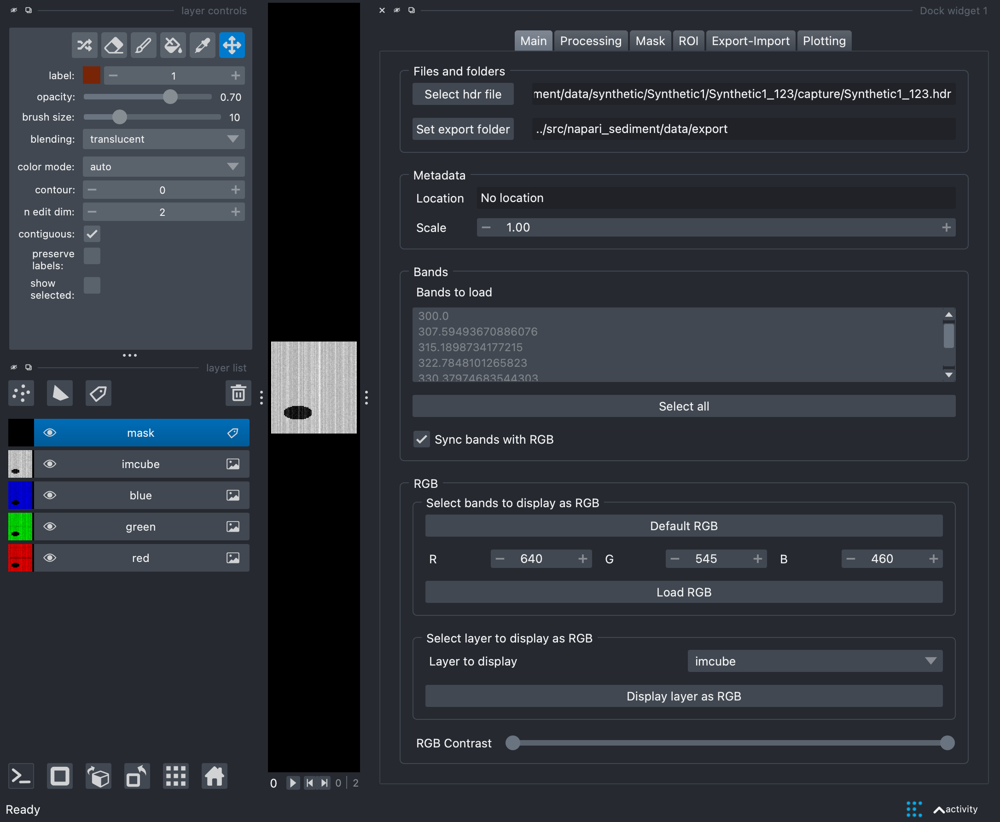

In [7]:
nbscreenshot(viewer)

When a file is selected, a series of layers are added to the viewer (see more below). By default only three bands corresponding to RGB wavelengths are loaded.

### Metadata

When an .hdr file is loaded, it's metadata such as wavelength of each band, are also read. Additional infos such as location of data acquisition and conversion factor from pixel to millimeters can be set manually.

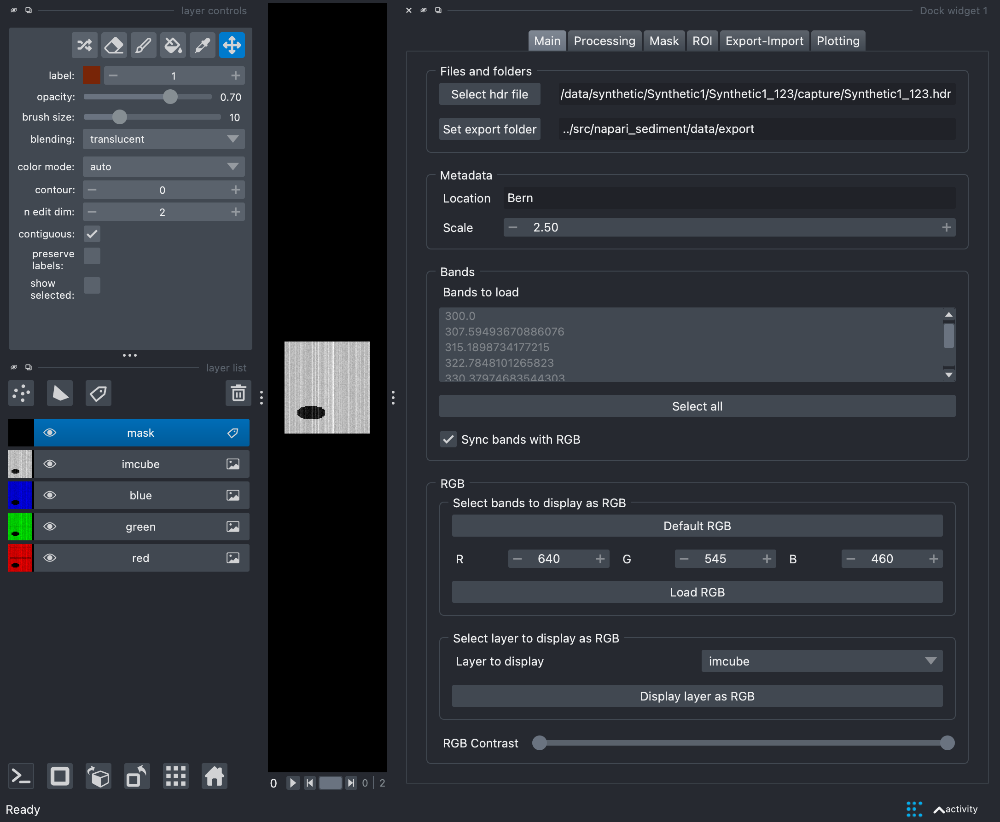

In [8]:
self.metadata_location.setText('Bern')
self.spinbox_metadata_scale.setValue(2.5)
nbscreenshot(viewer)

### Bands

Once a dataset has been loaded, all available bands are displayed in this list. One can then manually click on bands to be loaded. Bands are represented in two formats in the layer list and the viewer:
- ```imcube```: this layer contains all the selected bands loaded as a stack, i.e. they can be browsed through using the slider at the bottom of the viewer. This is the data that is generally used for computations
- ```red```, ```green```, ```blue```: three bands can also be visualized in separate layers. This allows to visualize these bands in a single RGB image.

In principle these two representations are independent, i.e. one can select bands for ```imcube``` and other bands for RGB. However it is often advantageous to keep the two representation in sync in order to visualize in RGB processing made on ```imcube```. This can be achieved by checking the ```Sync bands with RGB``` option.

To select multiple bands, hold the Shift key. The imported bands are stored in the ```imcube``` layer and not in separate layers . Beware that for large datasets, it is not recommended to load all bands as this will consume large amounts of memory.

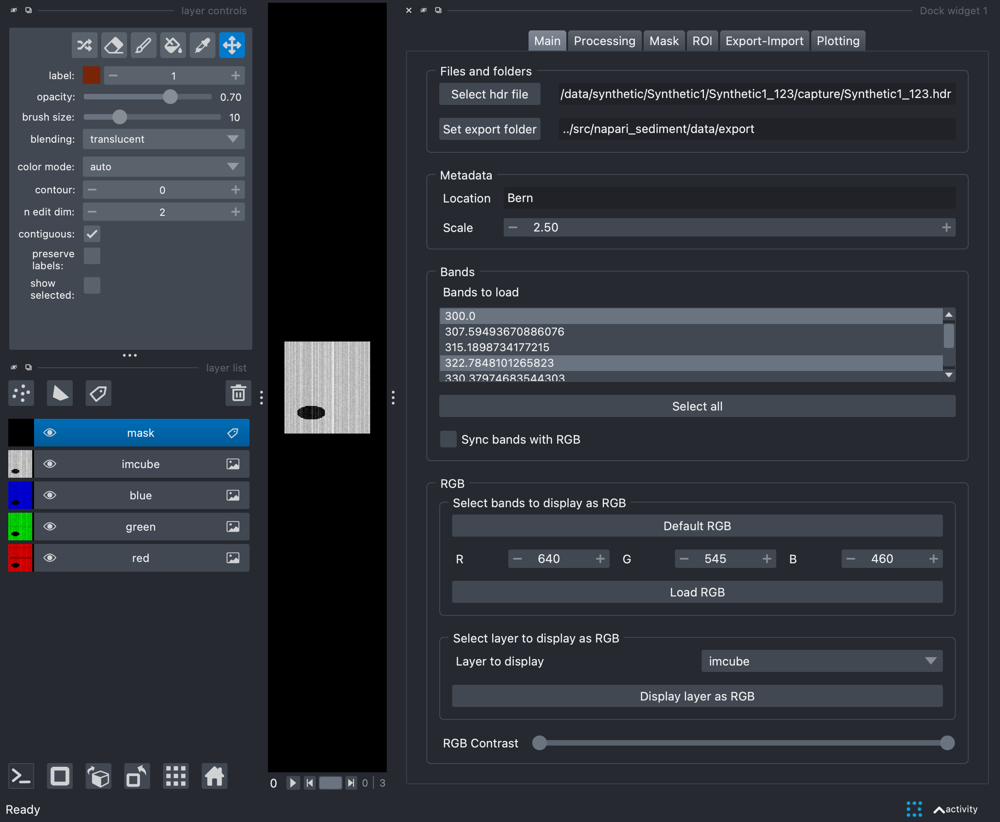

In [9]:
self.check_sync_bands_rgb.setChecked(False)
[self.qlist_channels.item(x).setSelected(False) for x in range(len(self.qlist_channels))]
[self.qlist_channels.item(x).setSelected(True) for x in [0,3,5,9]]
self._on_change_select_bands()
nbscreenshot(viewer)

### RGB

The RGB section allows you to control which bands are displayed as RGB. There are two ways to change the displayed RGB layers:

1. You can pick the wavelengths to be used for RGB using the three adjustable numbers. The closest wavelengths are selected in the list of actual wavelengths when ```Load RGB``` is pressed and the RGB layers updated.

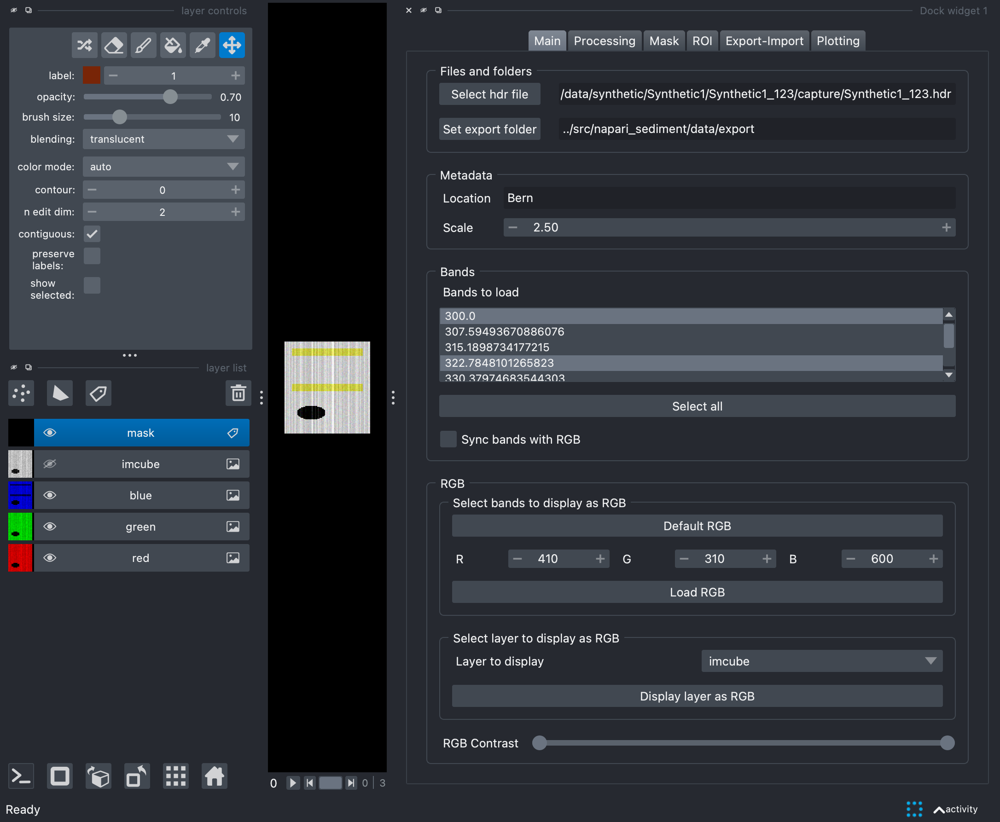

In [10]:
self.rgb_widget.spin_rchannel.setValue(410)
self.rgb_widget.spin_gchannel.setValue(310)
self.rgb_widget.spin_bchannel.setValue(600)
self.rgb_widget._on_click_RGB()
viewer.layers['imcube'].visible = False;
nbscreenshot(viewer)

2. Multidimensional layers such as ```imcube``` can also be displayed as RGB. Of course in that case if more than three channels are present, only the three first ones are used. The main application of this mechanism is to check pre-processing quality. In that case, only RGB wavelengths are loaded, then corrected (see below) and then the corrected data can be displayed as RGB.

Finally, the RGB contrast slider allows to adjust the contrast of all three RGB layers together.

## Processing

In the processing tab, one can perform background correction as well as destriping. Note that while background correction is necessary, destriping should not be used for quantitative measurements but only to display images.

### Background correction

Here one can see which reference files are used for background correction. If none have been found or the wrong ones are selected, they can be chosen manually with the ```Manual selection``` buttons.

One can then choose what to correct: either the loaded image cube which can contain arbitrary bands, or the loaded RGB data. Note that if the option ```Sync bands with RGB``` is checked, both ```imcube``` and ```RGB``` representations are corrected.

In [11]:
self.tabs.setCurrentIndex(1)
self._on_click_background_correct()

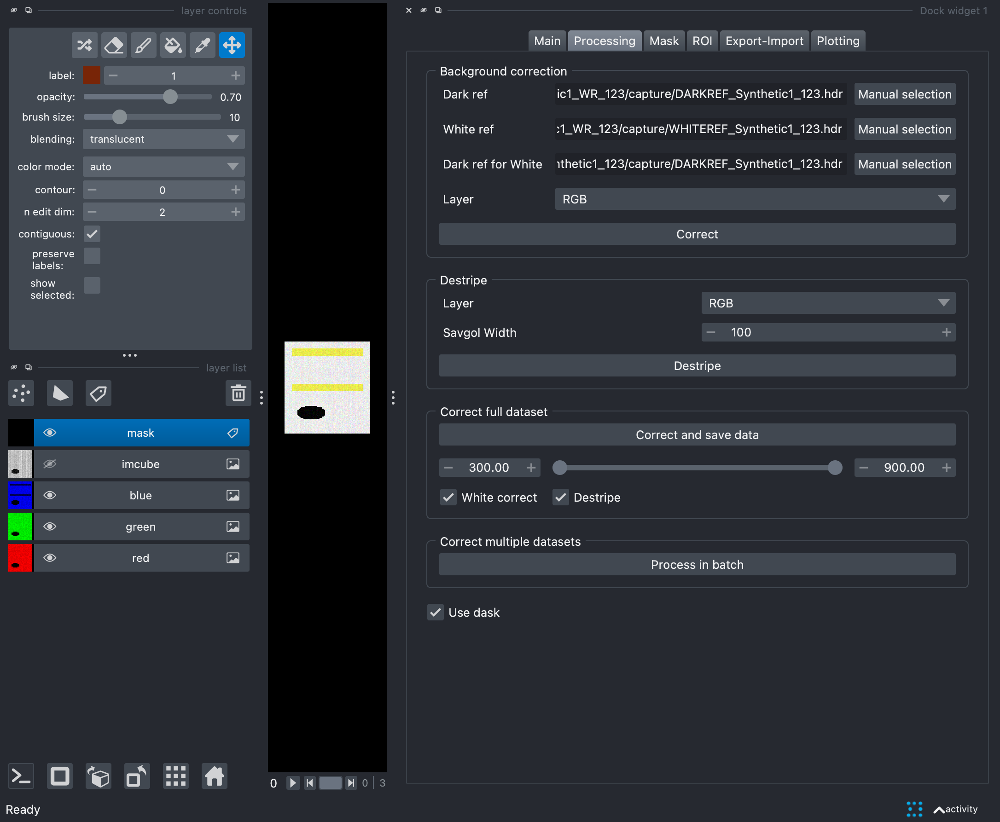

In [12]:
nbscreenshot(viewer)

### destriping

Destriping is performed using a Savgol filter (local fit of each scan line to remove outliers). The size of the region to fit is set using the ```Savgol Width```. Note that here you can choose which layer to destripe: ```imcube```, ```imcube_corrected``` or ```RGB```. In the latter case, if you also background corrected for RGB, then the red, green, blue layers will actually contain the completely pre-processed data that one can obtain later on in batch mode. This generates another layer called ```imcube_destripe```.

In [13]:
self._on_click_destripe()

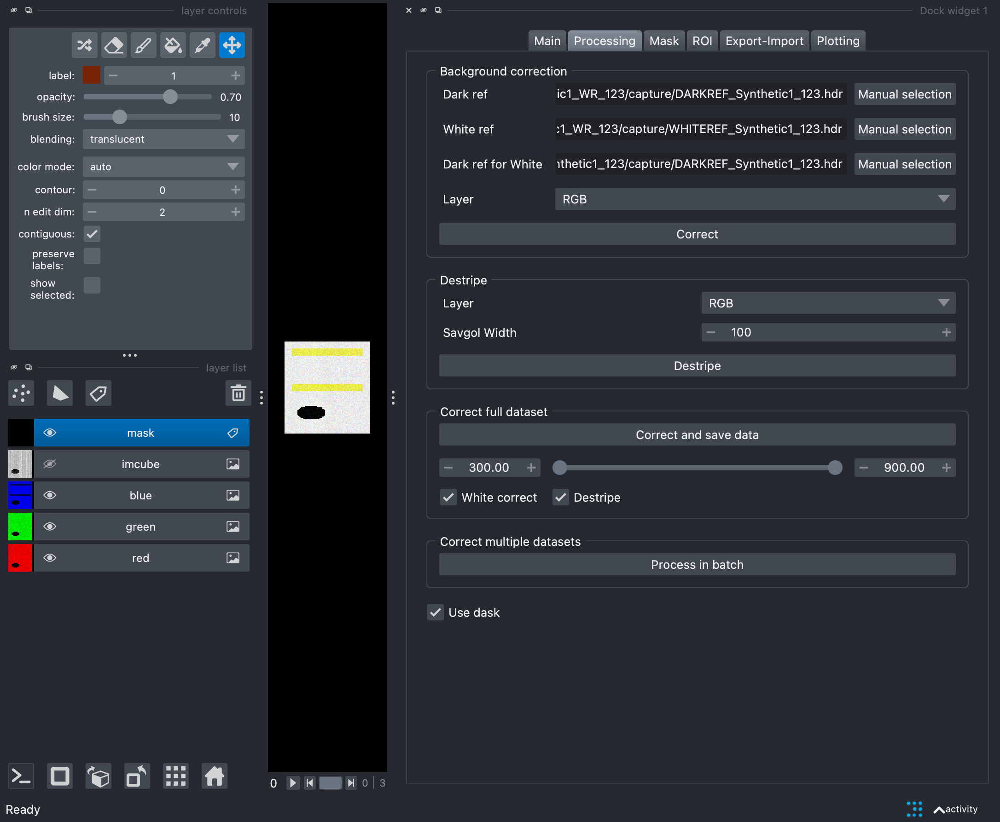

In [14]:
nbscreenshot(viewer)

### Correct full dataset

In this group of functions you can apply correction to the full dataset without the need to load it in the viewer (which is usually impossible because of its size). You can choose which correction to apply (destripe is always applied after white correction if both a re selected). You can also limit to bands to process. Data are saved in zarr format with the name ```corrected.zarr```.

In [15]:
self.check_batch_destripe.setChecked(False)
self._on_click_batch_correct()

## Correct multiple datasets

In this last part you can process a series of experiments using the same settings for:
- destriping
- background correction
- limits on bands

When clicking on the button, it opens a separate window where one can select a main folder to process and an export folder where to store the corrected data (below the window is shown docked to the viewer). The folder structure of the multi-experiment should be the following:
```
Multi_experiment_folder
├──Main1_123
│   ├──Experiment1_123
│   │   └── capture
│   │       ├── myfile_123.hdr
│   │       ├── myfile_123.raw
│   │       ├── DARKREF_myfile_123.hdr
│   │       ├── DARKREF_myfile_123.raw
│   │       └── ...
│   └──Experiment1_WR_123
│       └── capture
│           ├── WHITEREF_123.hdr
│           ├── WHITEREF_123.raw
│           ├── DARKREF_myfile_123.hdr
│           ├── DARKREF_myfile_123.raw
│           └── ...
├──Main2_345
│   ├──Experiment2_345
│   │   └── capture
│   │       ├── myfile_345.hdr
│   │       ├── myfile_345.raw
│   │       ├── DARKREF_myfile_345.hdr
│   │       ├── DARKREF_myfile_345.raw
│   │       └── ...
│   └──Experiment2_WR_345
│       └── capture
│           ├── WHITEREF_345.hdr
│           ├── WHITEREF_345.raw
│           ├── DARKREF_myfile_345.hdr
│           ├── DARKREF_myfile_345.raw
│           └── ...
├── ...
│ 
...
```
The folders ```Experiment1_123```, ```Experiment2_345``` are those that are listed in the widget. In the main export folder, each of the corrected data appears in a folder with the same name.

The same options as for the single dataset export are available here for background correction, destriping and band cropping. The options selected in the main widget are copied over automatically but can be adjusted. 

When options are set, one can click on ```Preprocess``` which will run pre-processing on all dataset within the main folder, i.e. a ```corrected.zarr``` file is generated for each dataset.

Note that this widget can be opened as a regular widget without the main widget, as shown here.

In [16]:
from napari_sediment.batch_preproc import BatchPreprocWidget
viewer2 = napari.Viewer()
self2 = BatchPreprocWidget(viewer2)
viewer2.window.add_dock_widget(self2);

In [17]:
self2._on_click_select_main_folder(main_folder='../src/napari_sediment/data/synthetic/')
self2.file_list.setCurrentRow(0)
self2.qlist_channels.setCurrentRow(30)
self2.qlist_channels._on_change_channel_selection()

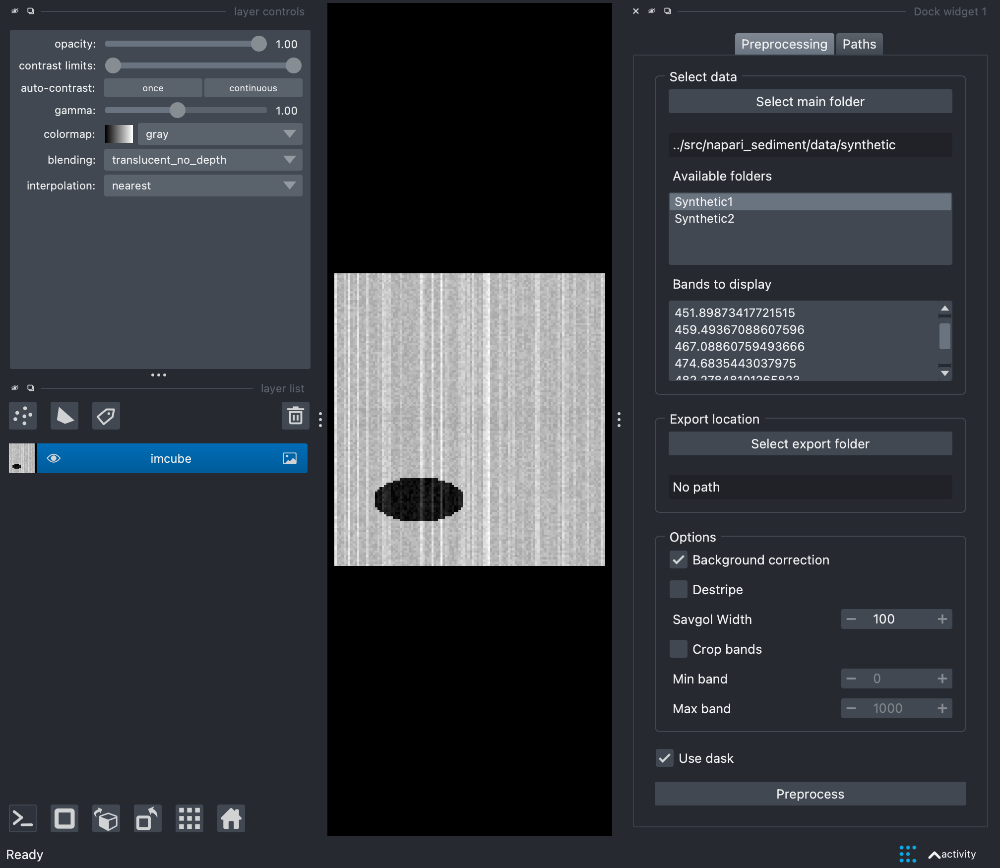

In [18]:
nbscreenshot(viewer2)

## Mask

Unwanted regions can be annotated in a label layer. This can be done manually, directly in the ```mask``` layer.

###  1. Create one ore more masks
A series of (Semi-)Automated methods are also available for this task.

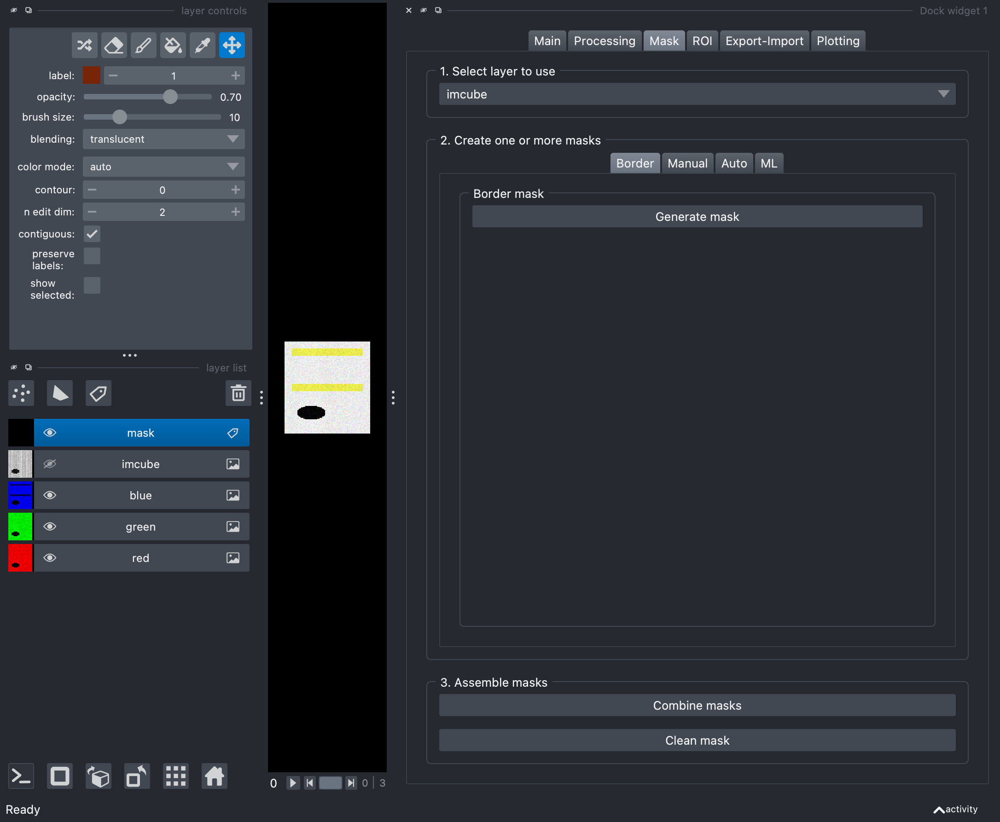

In [19]:
self.tabs.setCurrentIndex(2)
nbscreenshot(viewer)

- Border mask will detect rough borers around the image and try to mask them. This generates a layer called ```masked_border```
- Manual threshold: using the slider a minimum and maximum threshold can be applied on the average intensity of the RGB data.
- Automated threshold: here the values of the min and max threshold are computed automatically by fitting the average RGB intensity distribution with a Gaussian, and removing pixels beyond a certain width that can be adjusted
- Pixel classifier: here a classifier is trained based on a few annotated streaks on the image.

#### Pixel classifier

To be able to do the annotation, one needs first to choose which layer to use: both single channels (such as ```red```) or multi-channel layers such as ```imcube``` can be selected for training. More channels means longer computations but also more precision as relevant features will be detected in all channels. Then one can proceed with adding sparse annotations. For this one needs first to click on ```Add annotations/segmentations layers```. Annotations can be added in the ```annotations``` layer: background regions with 1 and foreground regions with 2. **Note that it is important to select the layer to use as data (layer to segment) before adding the annotation layer**.

In [25]:
self.mask_tabs.setCurrentIndex(3)

In [26]:
self.mlwidget.select_layer_widget.value = self.viewer.layers['imcube']
self.mlwidget.radio_multi_channel.setChecked(True)

In [27]:
self.mlwidget.add_annotation_layer()

In [28]:
self.viewer.layers['annotations'].data[45:50, 25:35] = 2
self.viewer.layers['annotations'].data[100:105, 23:29] = 1
self.viewer.layers['annotations'].refresh()

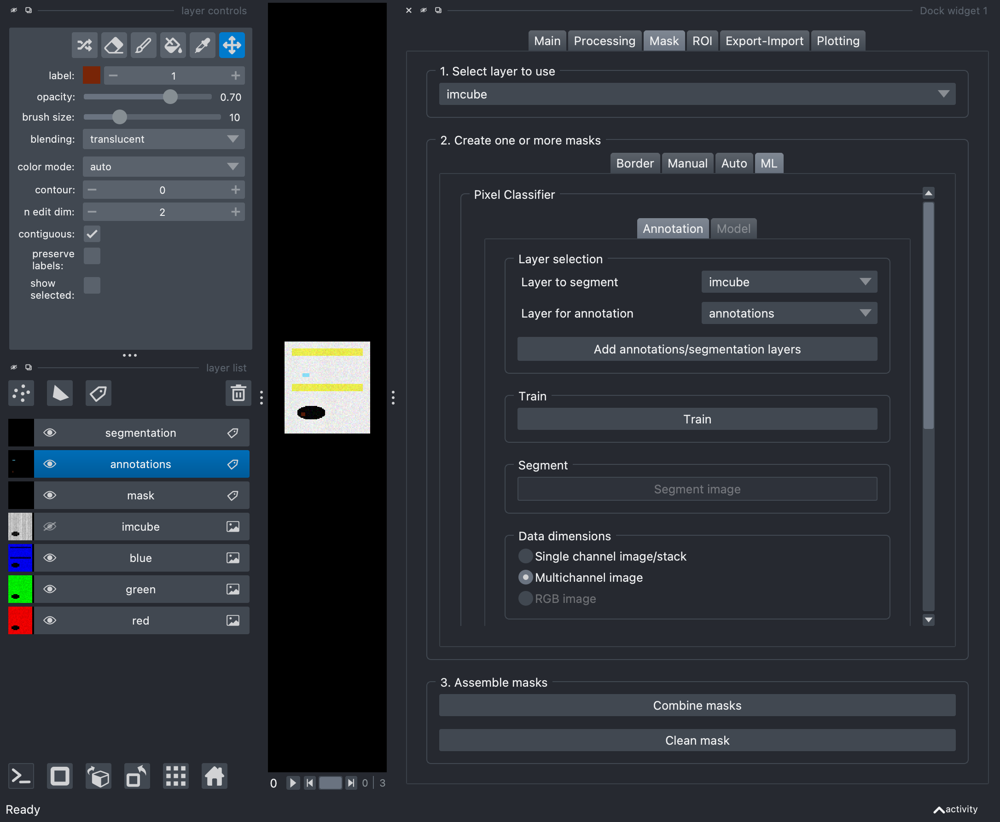

In [29]:
nbscreenshot(viewer)

Then one can train the model using ```Train``` and create a mask with ```Segment Image```. If the result is not satisfactory, one can add more annotations, retrain and re-generate the mask.

In [30]:
self.mlwidget.spin_downsample.setValue(1)
self.mlwidget.update_classifier()
self.mlwidget.prediction_btn.clicked.emit()

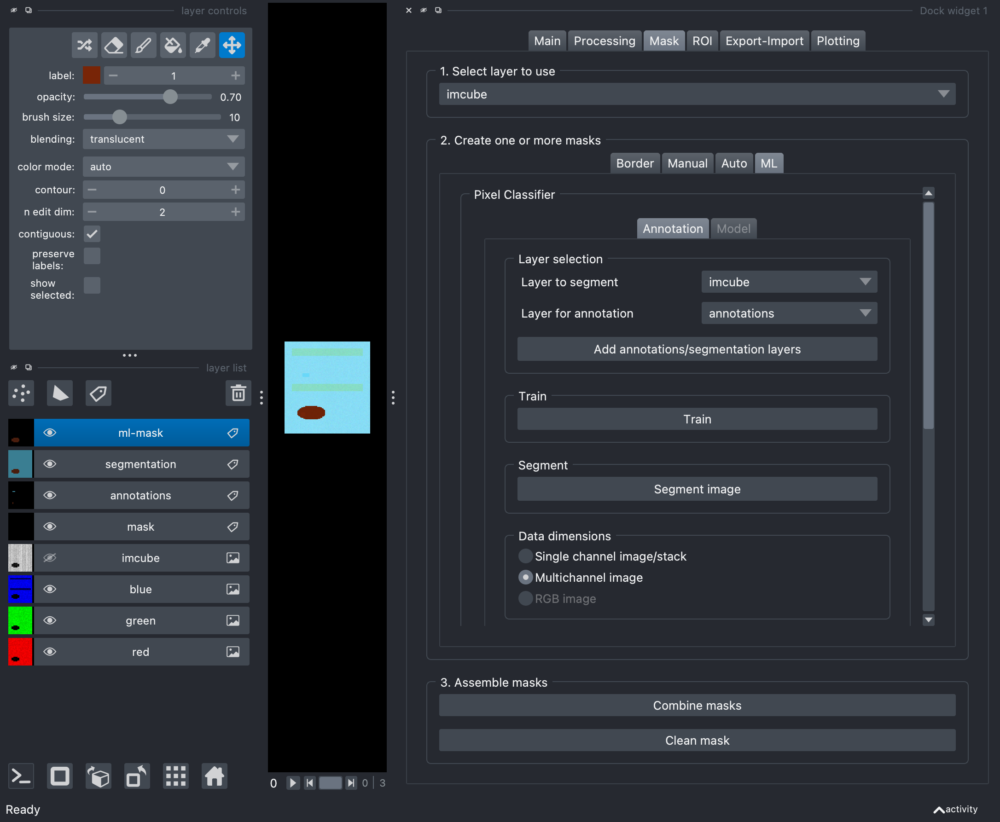

In [31]:
nbscreenshot(viewer)

### 2. Assemble

As potentially multiple masks were generated, e.g. one to exclude borders, one with a threshold, those need to be combined in a single mask. This can be done using ```Combine masks```. Finally the mask can be cleaned by closing holes in the mask using ```Clean mask```.

In [32]:
viewer.layers['segmentation'].visible = False
viewer.layers['annotations'].visible = False
self._on_click_combine_masks()

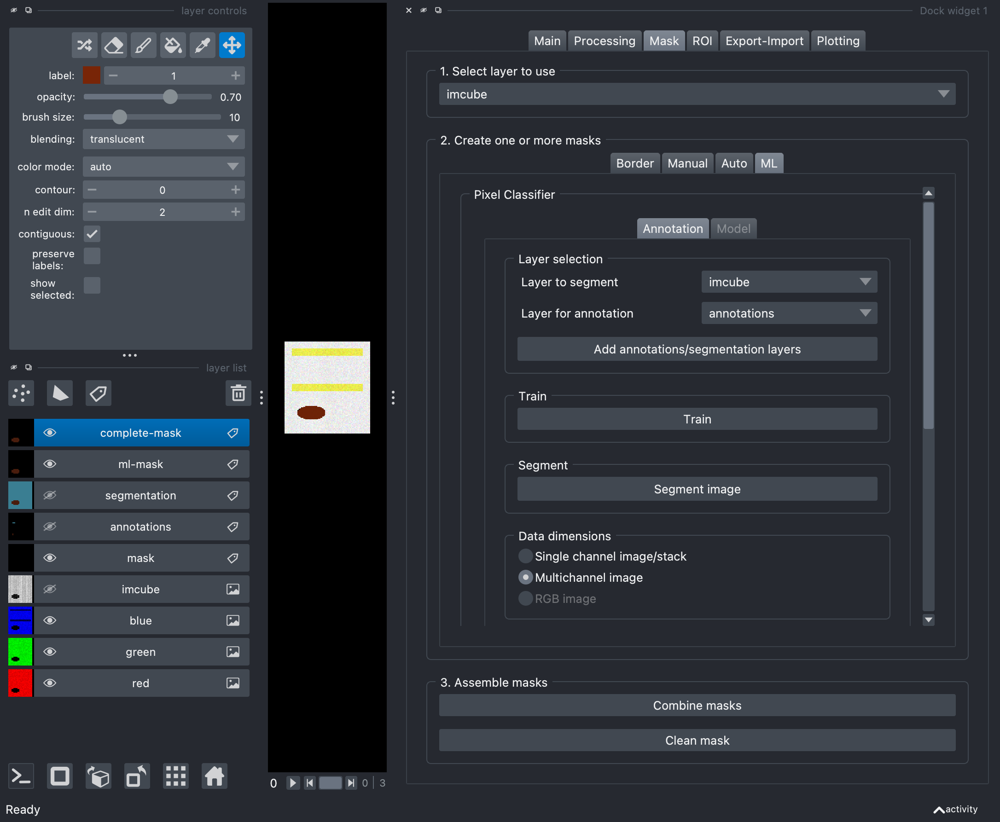

In [33]:
nbscreenshot(viewer)

## ROI

In the ROI tab one can set the regions of interest to analyze. The main ROI is defined as the largest box that contains lines which are not fully masked.

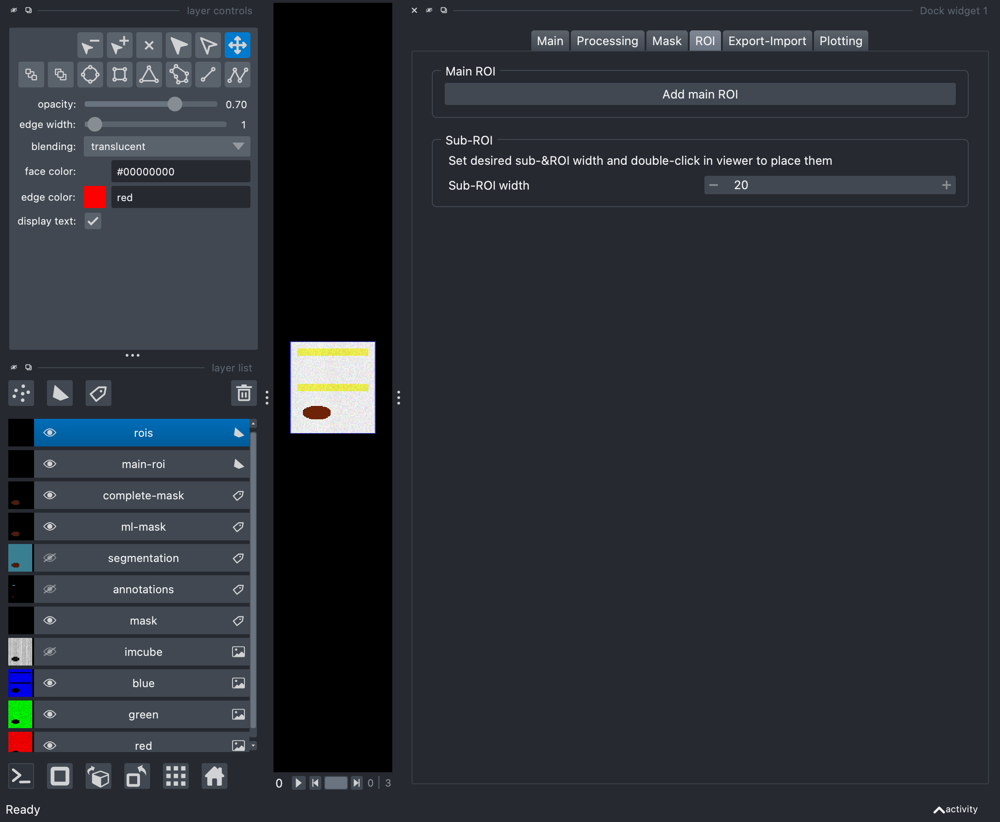

In [34]:
self.tabs.setCurrentIndex(3)
self._on_click_add_main_roi()
nbscreenshot(viewer)

Then single regions of interest can be added in the ```rois``` layer. One can either do that manually using the box annotator or by double-clicking on the image. This adds a roi with a width that can be adjusted in ```Sub-ROI width```.

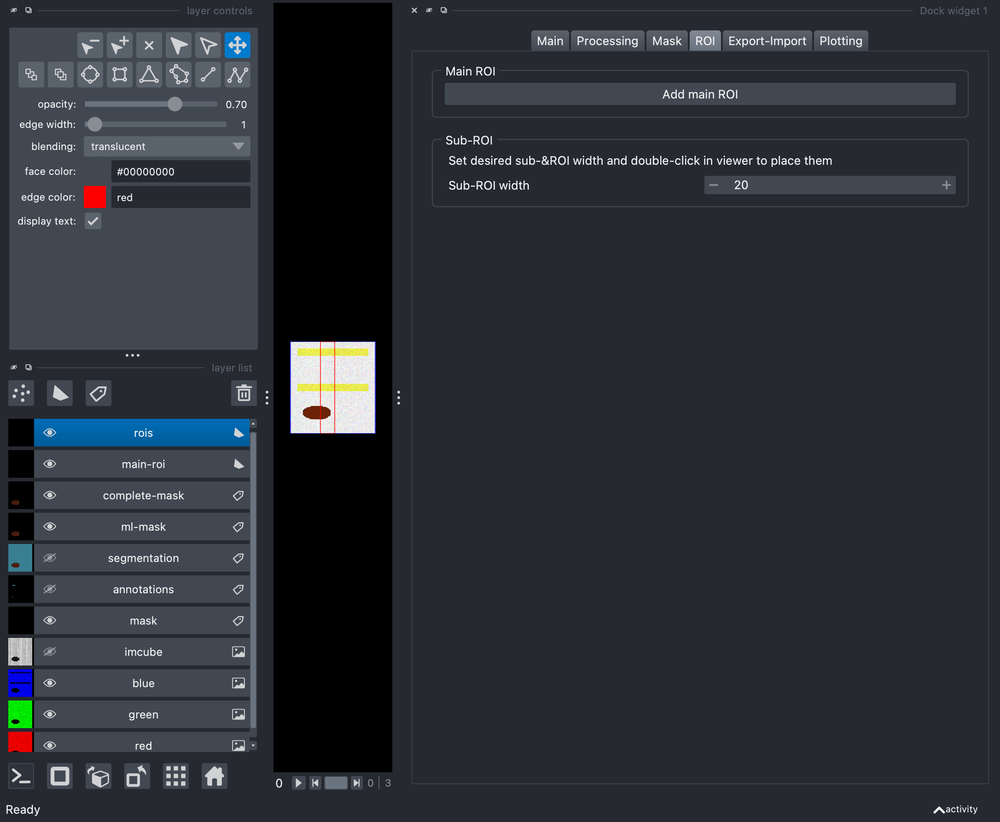

In [35]:
self._add_analysis_roi(cursor_pos=[0,0,52,0])
nbscreenshot(viewer)

## Export

Finally when all the work is done, one needs to save all the infos, including e.g. metadata, masks, rois etc. This can be done using the ```Export Project```. If an export folder has been set in the Main tab, that location will be used, otherwise a new one should be selected. That saved project can later on be reimported as well. It is also possible to export/import just the masks.

Finally, as snapshot of the current viewer can be taken, or the current RGB image exported in high resolution.

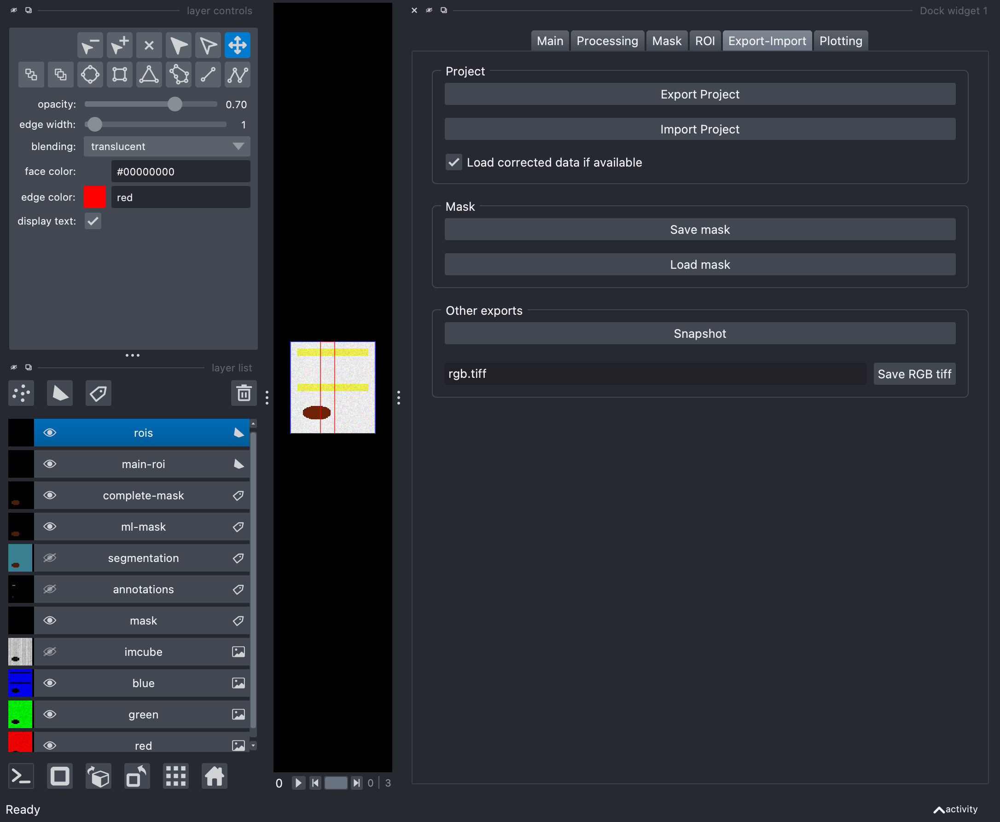

In [36]:
self.tabs.setCurrentIndex(4)
nbscreenshot(viewer)

In [37]:
self.export_project()

The main result of the export is the creation of a ```Parameters.yml``` file which contains all relevant information to re-import the dataset: location of data, coordinates of rois etc.